# 錯誤更正碼

##  規則

- 10% 出席
- 20% 隨堂考
- 30% 作業
- 20% 期中考
- 20% 期末考

為了減緩期中考跟期末考的壓力  
已經把大量權重挪到出席跟隨堂考（Kahoot）

### 出席跟隨堂考

十點後的某個時間點會開啟 Kahoot

出席的定義是 Kahoot 裡面有你的名字  
隨堂考則是看你答對多少題目  

無論任何理由（就算是公假或病假）  
出席成績與隨堂考無法以任何方式補救  

隨堂考總分會線性放大到有人滿分  
加退選期間（前兩周）不計分

### 期中考

期中考將在期中考週**前一週**的上課時間舉行  
期中考周當週不計算出席跟隨堂考

考試時間兩小時  
最後一小時開放使用紙本資料  
最後十分鐘開放使用 AI

可以戴耳機聽音樂  
但除了最後十分鐘外  
其他時間都不能操作手機

最終分數會線性放大到有人滿分

### 期末考

期末考將在期末考週前一週的上課時間舉行

其他類似期中考

### 作業

每次上完課會有兩份作業  
第一題的死線是星期五早上六點  
第二題的死線是星期一早上六點  

不接受任何理由遲交  
每遲到一分鐘懲罰 0.9999x  
半衰期 4.8 天


交到 NTU COOL  
只接受 PDF 檔 

作業由助教負責改  
太浪費時間的對的答案  
助教有權力扣到零分 

寫作 = 溝通 = 作業的一部份  

### 課程講義跟問題

課程講義（你現在看到的這個）  
https://nm.lk/correct

寄信（慢）  
Discord 私信（快）  
Discord 頻道問所有人（超快）  
https://nm.lk/dc  

### 課本

van Lint, Introduction to Coding Theory
台大有買電子書

舊的課本
1. Lin and Costello, Error Control Coding: Fundamentals and Applications
2. Blahut, Theory and Practice of Error Control Codes
3. Ryan and Lin, Channel Codes: Classical and Modern

## 開始上課

### 錯誤更正碼：用數學對抗錯誤

錯誤更正碼是一系列很有創意的數學結構  
可以粗略地把這門領域分成兩部分  

- **資訊理論（information theory）**  
    研究「什麼做得到、什麼做不到」的理論極限  
- **碼（codes）**  
    設計真正能偵測或更正錯誤的具體方法  


核心想法是  
當物質與材料逐漸逼近極限時  
剩下的改善空間往往要靠數學  
與其要求硬體永遠不出錯  
我們可以容許系統出現少量錯誤  
再利用數學把資料修正回來  


### 錯誤會出現在哪裡？

#### 通訊

- 藍牙 滑鼠 鍵盤 耳機  
- Wi-Fi 5G  
- 光纖與海底光纖  
- 衛星通訊  
- 深空通訊  
    例如詹姆士・韋伯太空望遠鏡  


#### 儲存

- 記憶體：利用帶電儲存資料
- 硬碟：利用磁性儲存資料  
- 光碟：利用凹坑與平面儲存資料  
- DNA 儲存（仍在發展中的方向）  

這些技術背後的市場規模可達數十億美元  


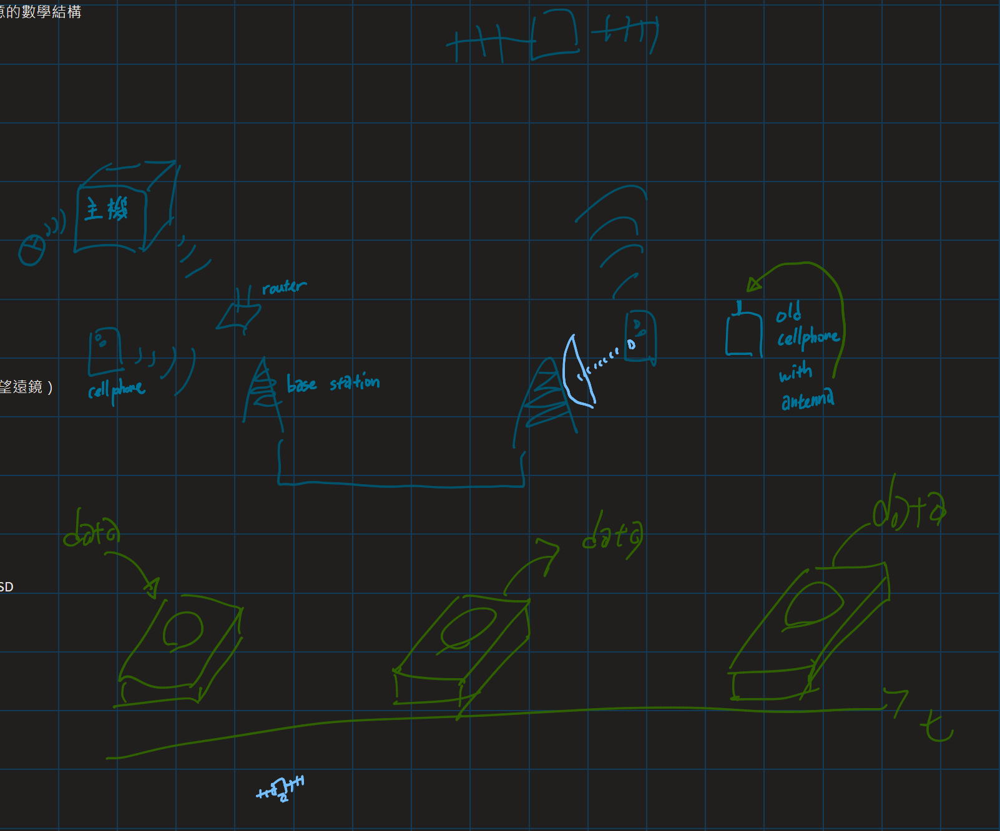

### 為什麼不只把硬體做好一點？

- **百密一疏**  
    檔案或傳輸量很大時  
    即使單一 bit 的錯誤機率很低  
    整份資料仍可能出錯  
- **硬體改善很昂貴**  
    加大天線  
    提高發射功率  
    改善儲存材料都有成本  
- **有些機會只有一次**  
    衛星或太空望遠鏡的發射成本極高  
    升空後也很難維修  


相較之下  
錯誤更正碼通常很便宜  
大部分基礎數學也不受專利限制  
因此可以採取一個看似反直覺的策略  

> 允許硬體偶爾「亂做」  
> 再用數學把結果修正回來  


### 什麼是「數學保證」？

模擬只能測試有限多種情況  
通常無法窮盡所有可能的錯誤模式  
數學證明則能說明  
只要假設成立  
結論就對所有情況成立  

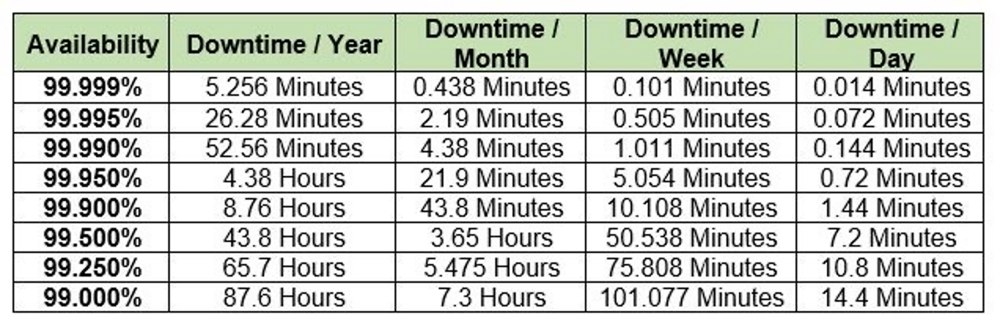


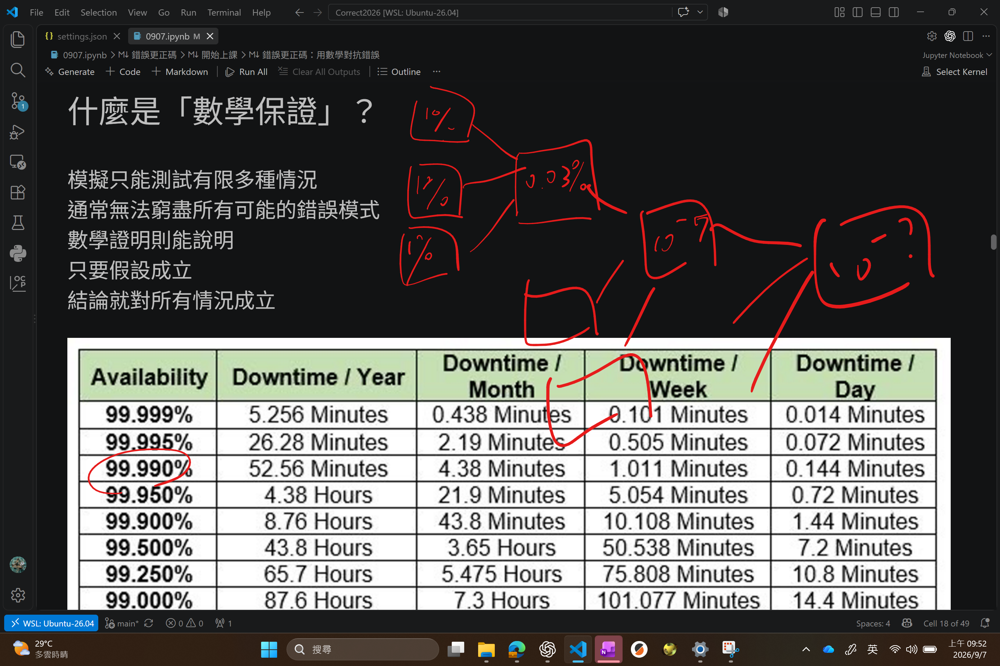


證明的目的之一  
是增加我們對系統的信心  

即使證明暫時不夠完整，或者只是憑經驗的估計  
只要清楚說明限制  
也仍然具有價值  


### 兩種基本策略：ARQ 與 FEC

- **ARQ（Automatic Repeat reQuest）**  
    「蛤，你說什麼」  
    接收端發現錯誤後  
    請傳送端重傳  
- **FEC（Forward Error Correction）**  
    「我已經講三次了，你應該懂了吧」  
    傳送端預先加入冗餘  
    接收端不必要求重傳就能更正錯誤  

ARQ 適合可以來回溝通的情境  
FEC 則適合延遲很高、無法重傳  
或只有一次傳送機會的情境  


### 第一個例子：repetition code


最簡單的更正方法是重複傳送  
重複兩次時  
如果兩份不同  
我們只知道有錯  
卻不知道哪一份正確  

因此通常偏好重複奇數次  
例如三次  
```text
QUICKBROWNFOX
QQQUUUIIICCCKKKBBBRRROOOWWWNNNFFFOOOXXX
```

傳輸後可能變成  

```text
QQQUUUIIICDCKKKBBBRRROQOWVWNNNFFFOOOXYY
```

接收端對每三個符號做 **majority decoding（多數決解碼）**  
看 0 比較多、還是 1 比較多  
ASCII 與 UTF-8 也是編碼方式  
在底層真正傳輸的仍是 0 與 1  


#### 三重 repetition code 的多數決解碼

原始資料經過編碼  

```text
000 111 111 000 111 000 000 111
```

收到的資料可能是  

```text
000 101 111 000 110 000 110 111
```

每組最多錯 1 個 bit 時  
多數決仍能還原原始 bit  
同一組若錯了 2 個或 3 個 bit  
解碼就會失敗


#### 解碼失敗的機率

若每個 bit 獨立翻轉的機率是 $p$  
則三重 repetition code 的精確解碼失敗率為  

$$P_{\mathrm{fail}} = \binom{3}{2}p^2(1-p)+p^3 =3p^2-2p^3.$$

當 $p$ 很小時  
$P_{\mathrm{fail}}\approx 3p^2$  
更一般地  
重複 $n$ 次（$n$ 為奇數）時  

$$P_{\mathrm{fail}} =\sum_{i=(n+1)/2}^{n}\binom{n}{i}p^i(1-p)^{n-i}.$$


### 「重複很多次」有什麼缺點？

它不是不正確  
而是效率不高  
三重 repetition code 傳 3 個 bit 才攜帶 1 個 bit 的資訊  
碼率只有 $1/3$  

我們希望用較少的冗餘得到相同或更好的保護  
這也是錯誤更正碼需要數十年研究的原因  


### 錯誤檢查碼：single parity-check code

考慮  

$$C=\{000,011,101,110\}.$$

每個 codeword 都有偶數個 1  
若一個 bit 被翻轉  
收到的向量就會有奇數個 1  
因此能發現錯誤  
但只看結果通常無法知道究竟是哪個 bit 錯了  

> 「我知道這樣不對，但是我不知道怎麼改」  


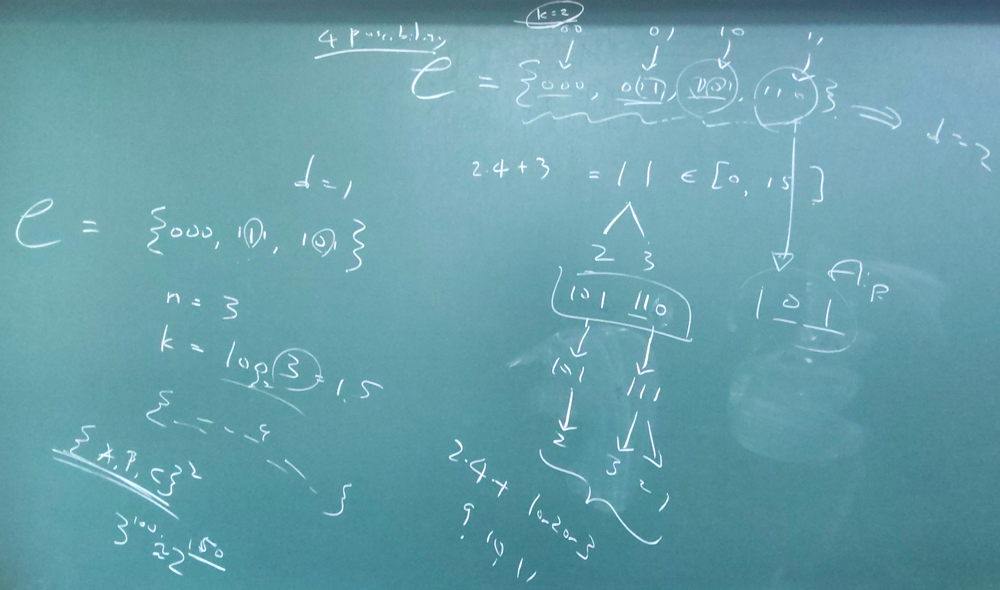


這四個 codeword 可以想成三維立方體的四個頂點  
類似的錯誤檢查概念也出現在身分證號碼  
銀行帳號與戶名核對等情境  


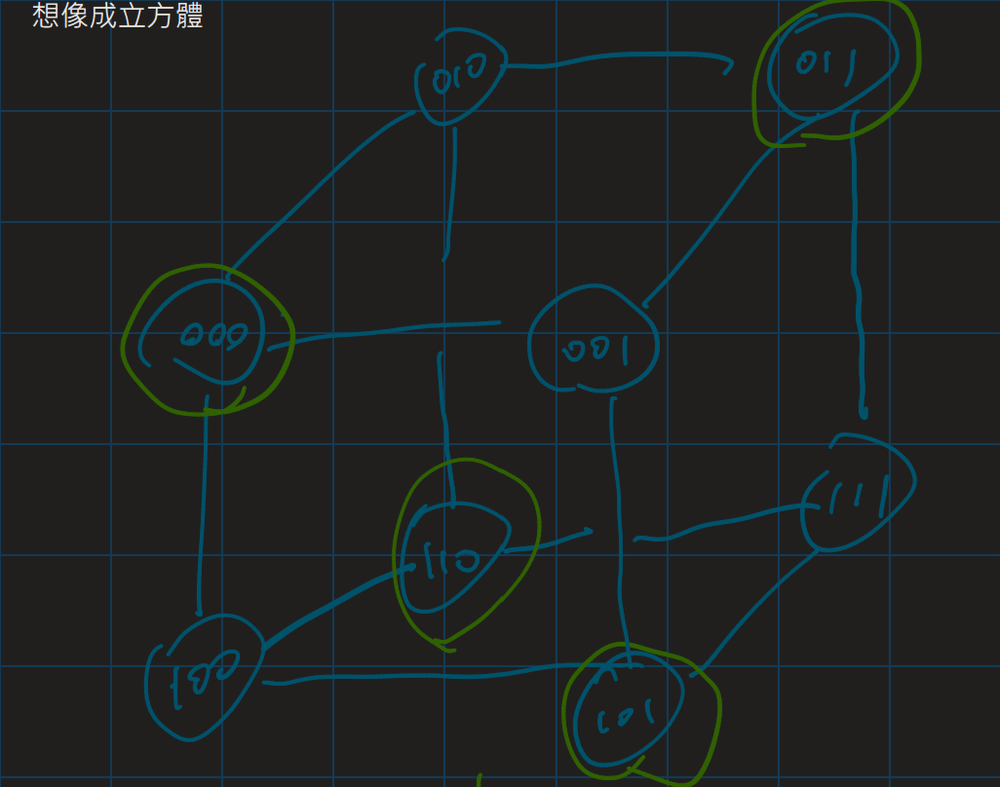

### 最一般的 block code：$[n,k,d]$

除了 repetition code 與 single parity-check code  
還有更複雜的碼  
例如 **Hamming $[7,4,3]$ code**  

- $n$  
    **block length**  
    每個 codeword 的總長度  
    固定其他條件時  
    通常希望越小越省空間  
- $k$  
    **dimension**  
    每個 codeword 實際攜帶的資訊 bit 數  
    碼率為 $R=k/n$  
    通常希望越大越有效率  
- $d$  
    **minimum distance**  
    任兩個不同 codeword 之間最少相差幾個位置  
    通常希望越大  
    抗錯能力越強


#### Minimum distance 的保證

若最小距離為 $d$ 便能保證  

- 偵測最多 $d-1$ 個 bit flip  
- 更正最多 $t=\left\lfloor (d-1)/2\right\rfloor$ 個 bit flip  

$n, k, d$ 不可能在沒有代價的情況下同時改善  
設計 code 的核心就是在效率與可靠度之間取捨


### Singleton bound

考慮一個 binary $[n,k,d]$ code  

從每個 codeword 刪掉任意 $d-1$ 個位置  
剩下 $n-d+1$ 個 bits  

刪除之後  
不同的 codewords 仍然不能變成同一個向量  

不然它們原本只會在被刪掉的位置不同  
距離最多是 $d-1$  
跟 minimum distance 是 $d$ 矛盾  


所以 $2^k$ 個 codewords  
必須放進 $2^{n-d+1}$ 個向量裡面  

$$2^k\le 2^{n-d+1}$$

也就是  

$$n-k\ge d-1$$


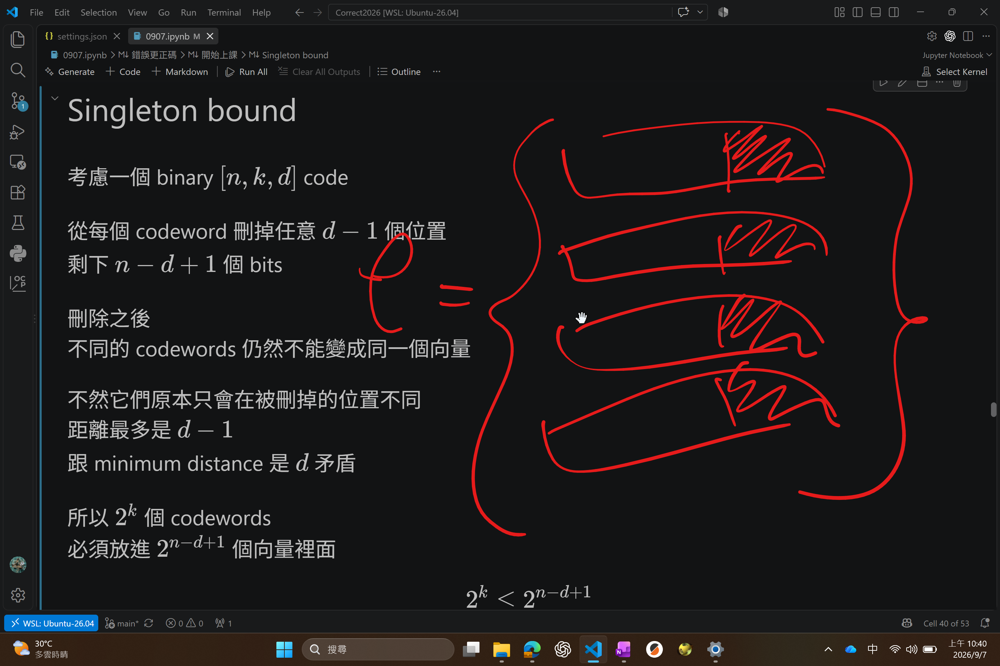

#### Singleton bound 的意義

這就是 **Singleton bound**  

換句話說  
為了得到 minimum distance $d$  
至少需要 $d-1$ 個 redundant bits  


等號成立的 code 稱為 **MDS code**  
也就是 maximum distance separable code  

對 Hamming $[7,4,3]$ code  

$$3<7-4+1=4$$

所以 Hamming $[7,4,3]$ code 達到 sphere packing bound  
但是沒有達到 Singleton bound


### 圖論觀點與 sphere packing

所有長度為 $n$ 的 binary vectors 可以看成超立方體的 $2^n$ 個頂點  
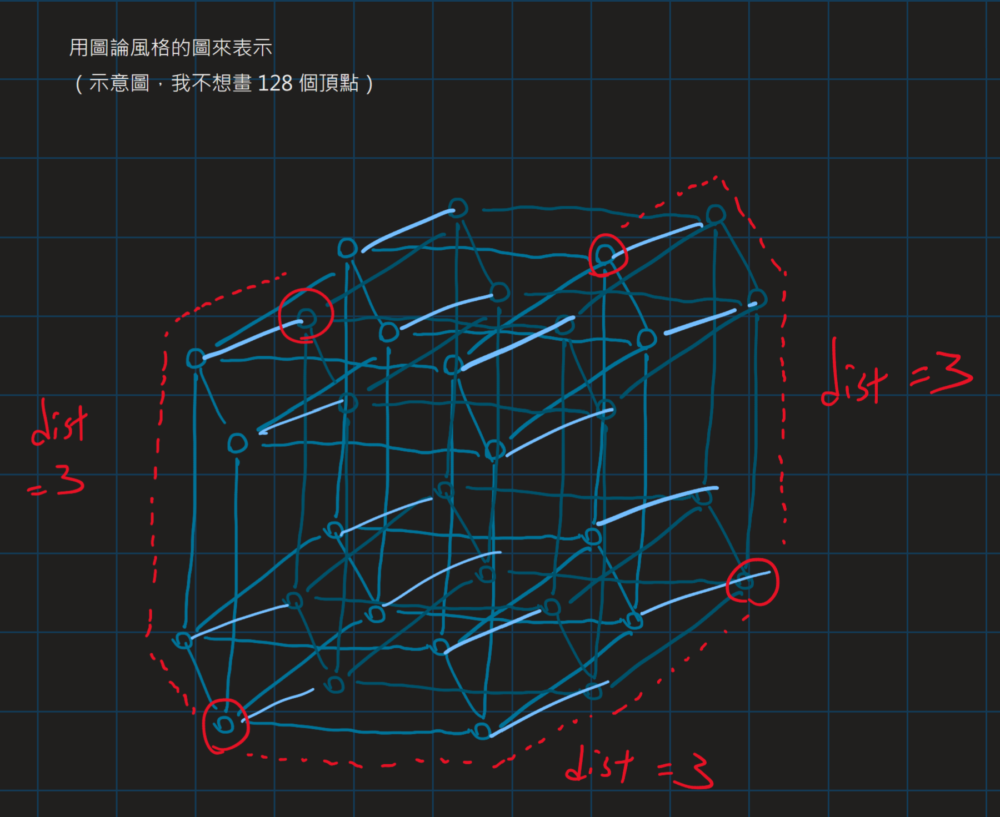


另一種更抽象的想法  
是在每個 codeword 周圍畫一個半徑為 $t$ 的 Hamming sphere  
為了讓所有距離 codeword 至多 $t$ 的向量都能被唯一解碼  
這些球不能重疊  
因此得到 **sphere-packing bound（Hamming bound）**  

$$2^k\sum_{i=0}^{t}\binom{n}{i}\le 2^n.$$

這可以視為鴿籠原理的應用  
等號成立的 code 稱為 **perfect code**


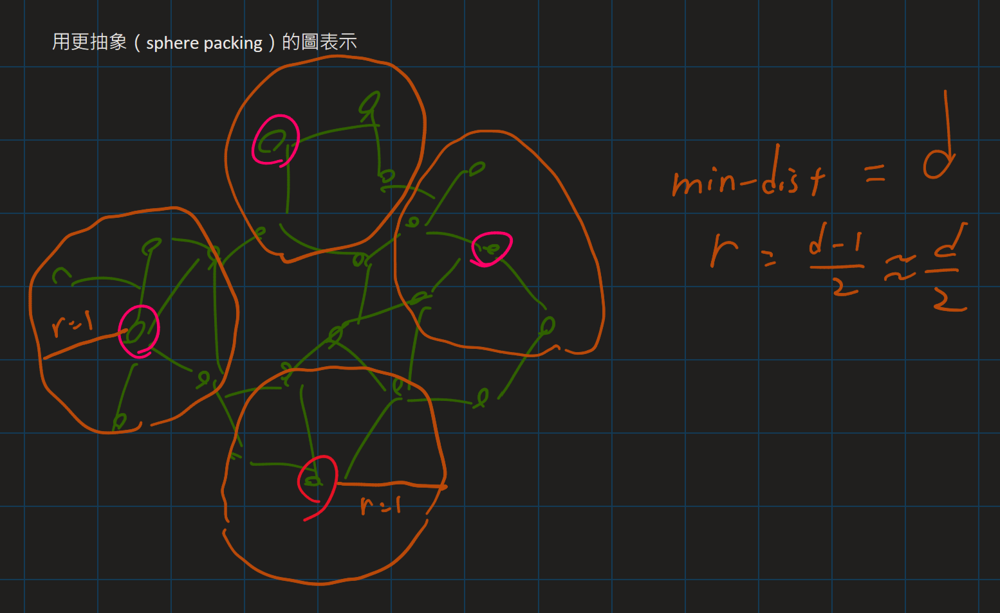

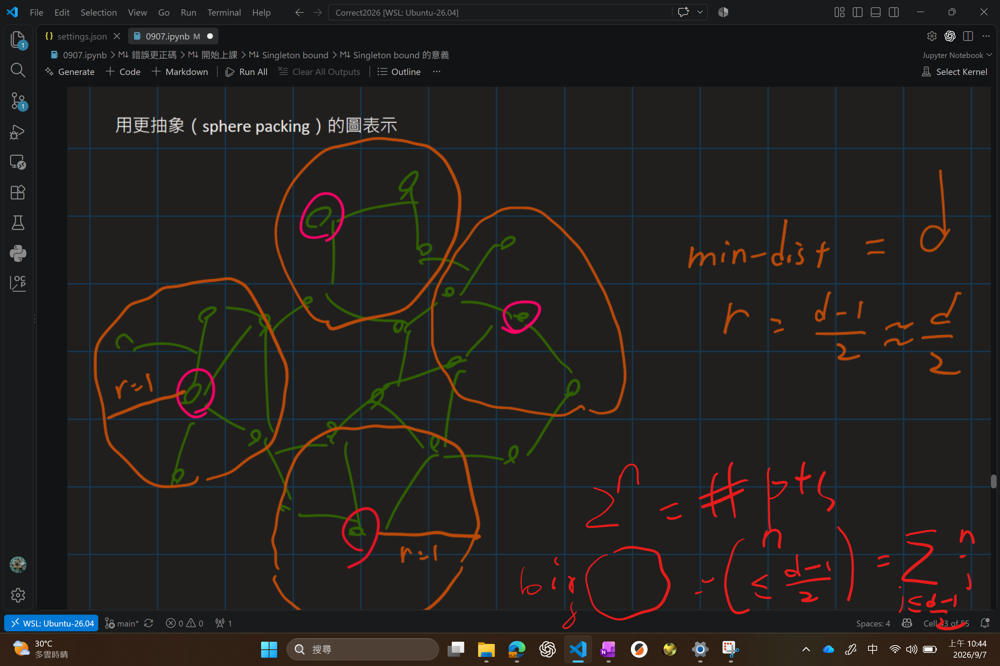

#### Perfect code

Hamming $[7,4,3]$ code 中  
$t=1$  
而  

$$2^4\left[\binom70+\binom71\right]=16(1+7)=128=2^7,$$

所以它是一個 perfect code


### Hamming $[7,4,3]$ code：systematic encoding

把 4 個資料 bit 記為 $a,b,c,d$  
並把 parity bits 放在第 1  
2  
4 個位置  

$$(p,q,a,r,b,c,d).$$

所有運算都在 modulo 2 下進行  
因此加法等同 XOR  
令  

$$
\begin{aligned}
p&=a+b+d,\\
q&=a+c+d,\\
r&=b+c+d.
\end{aligned}
$$

這樣就能把任何 4-bit message $(a,b,c,d)$ 編成一個 7-bit codeword  


### 用 parity-check matrix $H$ 定義 Hamming code

令  

$$
H=
\begin{bmatrix}
0&0&1\\
0&1&0\\
0&1&1\\
1&0&0\\
1&0&1\\
1&1&0\\
1&1&1
\end{bmatrix}.
$$

所有滿足  

$$vH=(0,0,0)\pmod 2$$

的向量 $v=(p,q,a,r,b,c,d)$ 都稱為 codeword  
矩陣 $H$ 的第 $j$ 列正好是 $j$ 的三位元二進位表示  


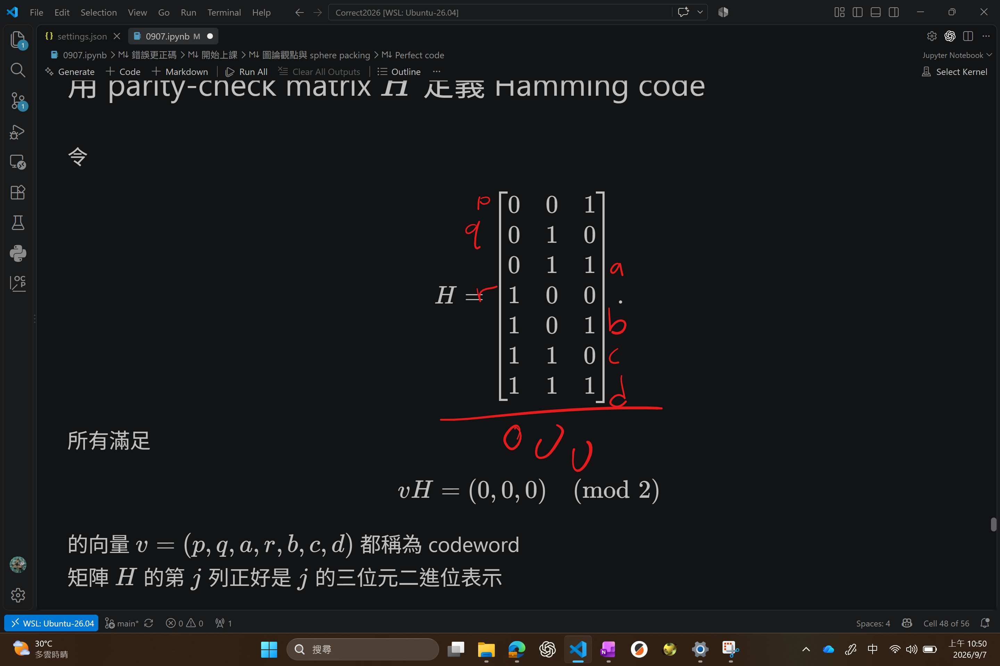

### Hamming decoding：更正至多 1 個 bit flip

收到向量 $u$ 後  
計算 syndrome  

$$uH=(x,y,z).$$

- 若 $(x,y,z)=(0,0,0)$  
    解碼器不更動任何 bit  
- 否則  
    $4x+2y+z$ 就是出錯位置的編號  
    把該位置的 bit flip 回去即可  

因此  
只要真的至多出現 1 個 bit flip  
$H$ 就會自動指出哪一個 bit 錯了  
若同一個 block 出現 2 個以上的錯誤  
這個保證便不成立


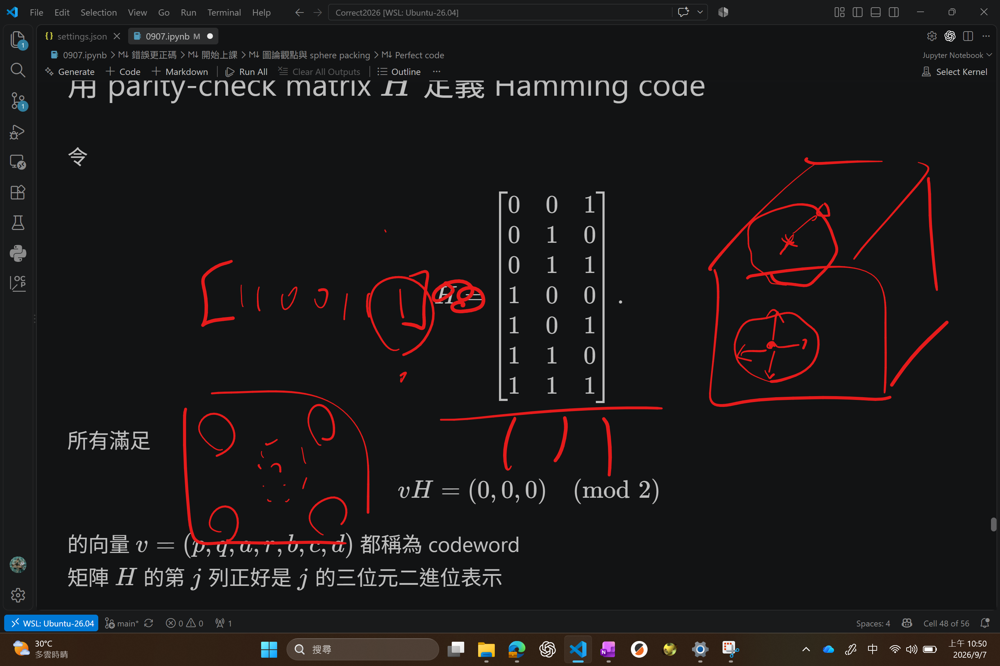

### Performance analysis

假設每個 bit 獨立以機率 $p$ 翻轉  
Hamming $[7,4,3]$ code 能正確處理 0 個或 1 個 bit flip  
因此解碼失敗的精確機率是  

$$
\begin{aligned}
P_{\mathrm{fail}}
&=1-\left[(1-p)^7+7p(1-p)^6\right]\\
&=21p^2-70p^3+105p^4-84p^5+35p^6-6p^7.
\end{aligned}
$$


#### 當 $p$ 很小時

當 $p$ 很小時  
主導項為  

$$P_{\mathrm{fail}}\approx \binom72p^2=21p^2.$$

也就是說  
原本一階的 bit error probability 經過編碼後  
block decoding failure probability 從 $O(p)$ 改善為 $O(p^2)$


## 作業

### 週五題

考慮使用  

$$C=\{000,011,101,110\}.$$

1. 考慮 binary erasure channel $\operatorname{BEC}(r)$  
    令 $f(r)$ 為解碼錯誤的機率（只要還有希望就盡量猜）  
    請畫出 $f(r)$  
2. 考慮 binary symmetric channel $\operatorname{BSC}(s)$  
    令 $g(s)$ 為解碼錯誤的機率（只要還有希望就盡量猜）  
    請畫出 $g(s)$  


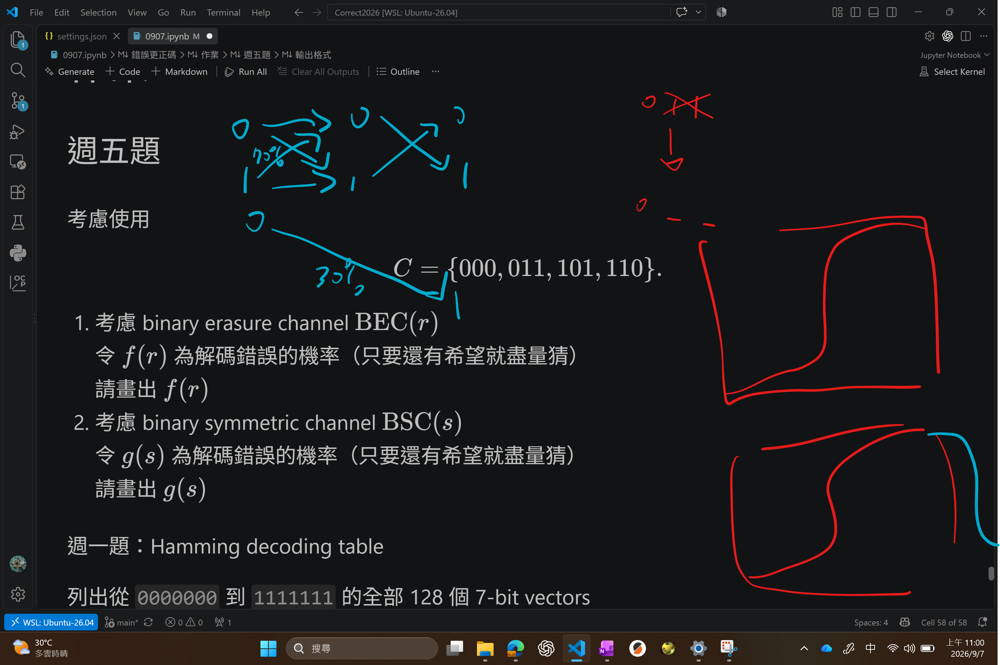

週一題：Hamming decoding table

列出從 `0000000` 到 `1111111` 的全部 128 個 7-bit vectors  
並在每個向量右邊寫下依照 Hamming $[7,4,3]$ 規則得到的最近 codeword  

對每個左側向量 $u$  

1. 計算 syndrome  
    $uH=(x,y,z)$  
2. 計算 $j=4x+2y+z$  
3. 若 $j=0$  
    則 $u$ 已經是 codeword  
    若 $j\ne0$  
    把 $u$ 的第 $j$ 個 bit 翻轉  
4. 把所得的 7-bit decoding result 寫在 $u$ 的右邊


#### 輸出格式

開頭應該是  

```text
00000000 00000000
00000001 00000000
00000010 00000000
00000011 10000011
00000100 00000000
```
